In [68]:
import pandas as pd
import numpy as np
from tqdm.auto import tqdm
import requests
from IPython.display import display

from concurrent.futures import ThreadPoolExecutor
from concurrent.futures import as_completed

In [69]:
df_steam_list = pd.read_csv("./dataset/steamvr_game_list.csv", index_col=0)
df_steam_list = df_steam_list[df_steam_list["VrTarget"] == "VR Only"] # VR 전용 게임만 대상으로 필터링
df_steam_list.dropna(subset=["Genre"], inplace=True)
df_steam_list.sort_values(by=["Reviews"], ascending=False, inplace=True)
df_steam_list.reset_index(drop=True, inplace=True)
display(df_steam_list)
# display(df_steam_list.describe())

genre_list = {}
title2genre = {}
for i in range(len(df_steam_list)):
    title = str(df_steam_list.loc[i, "Title"])
    genres = df_steam_list.loc[i, "Genre"]
    
    for g in genres.split(","):
        if not g in genre_list:
            genre_list[g] = 1
    
    title2genre[title] = genres
genre_list = list(genre_list.keys())

# 게임 장르 아닌 것들 제외
genre_exeception = [
    "Indie", "Early Access", "Free to Play", "Utilities", "Design & Illustration",
    "Animation & Modeling", "Video Production", "Audio Production", "Education",
    "Accounting", "Game Development", "Photo Editing", "Software Training",
    "Web Publishing"
]
genre_list = list(set(genre_list) - set(genre_exeception))
genre_list

,Popularity,Title,Score,Reviews,Price,ReleaseDate,VrTarget,Genre,Url
0,73,Half-Life: Alyx,98,62048,59.99,2020-03-23,VR Only,"Action,Adventure",https://store.steampowered.com/app/546560/
1,50,Beat Saber,96,58175,29.99,2019-05-21,VR Only,Indie,https://store.steampowered.com/app/620980/
2,24,Blade and Sorcery,96,31159,19.99,2018-12-11,VR Only,"Action,Adventure,Early Access,Indie,RPG,Simula...",https://store.steampowered.com/app/629730/
3,16,Pavlov VR,94,30582,24.99,2017-02-27,VR Only,"Action,Early Access,Indie",https://store.steampowered.com/app/555160/
4,30,BONEWORKS,92,28132,29.99,2019-12-10,VR Only,"Action,Adventure,Indie,Simulation",https://store.steampowered.com/app/823500/
...,...,...,...,...,...,...,...,...,...
2004,0,STYLY：VR PLATFORM FOR ULTRA EXPERIENCE,100,10,0,2017-09-28,VR Only,Design & Illustration,https://store.steampowered.com/app/693990/
2005,0,WiseMind,60,10,19.99,2017-06-13,VR Only,"Early Access,Software Training",https://store.steampowered.com/app/632520/
2006,0,Tractorball,60,10,9.99,2017-10-04,VR Only,"Action,Indie,Racing,Sports",https://store.steampowered.com/app/683790/
2007,0,Sky Tower,60,10,4.99,2016-04-25,VR Only,"Casual,Indie,Simulation",https://store.steampowered.com/app/395880/


['Strategy',
 'RPG',
 'Action',
 'Massively Multiplayer',
 'Racing',
 'Adventure',
 'Sports',
 'Casual',
 'Simulation']

In [87]:
def get_reviews(appid, params={"json": 1}):
    url = "https://store.steampowered.com/appreviews/" + appid
    r = requests.get(url=url, params=params, headers={"User-Agent": "Mozilla/5.0"})
    return r.json()

def get_n_reviews(appid, n=100):
    reviews = []
    cursor = "*"
    params = {
        "json": 1,
        "filter": "all",
        "language": "english",
        "day_range": 9223372036854775807,
        "review_type": "all",
        "purchase_type": "all"
    }

    while n > 0:
        params["cursor"] = cursor.encode()
        params["num_per_page"] = min(100, n)
        n -= 100

        r = get_reviews(appid, params=params)
        cursor = r["cursor"]
        reviews += r["reviews"]

        if len(r["reviews"]) < 100:
            break
    
    return reviews

In [88]:
MAX_REVIEWS_PER_APP = 3000

def scrape_wrapper(start: int, end: int)->pd.DataFrame:
    df_piece = pd.DataFrame()
    for i in tqdm(range(start, end)):
        title = df_steam_list.loc[i, "Title"]
        # genre = df_steam_list.loc[i, "Genre"]
        appid = df_steam_list.loc[i, "Url"].split("/")[-2]

        df_reviews = pd.DataFrame(get_n_reviews(appid, n=MAX_REVIEWS_PER_APP))
        if df_reviews is None:
            print(f"{title} failed to scrape. Skip")
            continue

        df_reviews = pd.concat({title: df_reviews}, names=["Title"])
        df_piece = pd.concat([df_piece, df_reviews])
    
    return df_piece

def multi_scrape()->pd.DataFrame:
    swamp_end = 300
    swamp = [(i, i+30) for i in range(0, swamp_end, 30)] # 처음 300개 게임은 리뷰 매우 많음 -> 최대한 업무 분산
    work_list = swamp + [(i, min(i + 300, len(df_steam_list))) for i in range(swamp_end, len(df_steam_list), 300)]
    print(work_list)

    df_result = pd.DataFrame()
    with ThreadPoolExecutor(max_workers=8) as executor:
        futures = [executor.submit(scrape_wrapper, work[0], work[1]) for work in work_list]

        for future in as_completed(futures):
            result = future.result()
            df_result = pd.concat([df_result, result])
    
    return df_result

In [89]:
multi_scrape().to_csv(f"./dataset/steamvr_reviews_n{MAX_REVIEWS_PER_APP}.csv")

[(0, 30), (30, 60), (60, 90), (90, 120), (120, 150), (150, 180), (180, 210), (210, 240), (240, 270), (270, 300), (300, 600), (600, 900), (900, 1200), (1200, 1500), (1500, 1800), (1800, 2009)]


  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/300 [00:00<?, ?it/s]

  0%|          | 0/209 [00:00<?, ?it/s]

# 장르별 키워드를 워드클라우드로 시각화

In [73]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import nltk
from collections import Counter
from PIL import Image

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "notebook"

In [71]:
df_reviews = pd.read_csv("./dataset/steamvr_reviews_n3000.csv", index_col=[0,1])

# 장르 표시
df_reviews["genre"] = ""
for title in df_reviews.index.levels[0]:
    df_reviews.loc[title, "genre"] = title2genre[title]
df_reviews.head()

recommendationid  \
Title                                      
All-In-One Sports VR 0          89709946   
                     1          97580749   
                     2          87601109   
                     3          87505448   
                     4          87449647   

                                                                   author  \
Title                                                                       
All-In-One Sports VR 0  {'steamid': '76561198078187111', 'num_games_ow...   
                     1  {'steamid': '76561197994002775', 'num_games_ow...   
                     2  {'steamid': '76561197965526227', 'num_games_ow...   
                     3  {'steamid': '76561198169180134', 'num_games_ow...   
                     4  {'steamid': '76561198245375086', 'num_games_ow...   

                       language  \
Title                             
All-In-One Sports VR 0  english   
                     1  english   
                     2  english   
                     3  english   
                     4  english   

                                                                   review  \
Title                                                                       
All-In-One Sports VR 0  Initially I was someone thrilled with All-In-O...   
                     1  In current reviews I notice that quite a few p...   
                     2  i bought this game thinking it looked fun and ...   
                     3         All-In-One Sports VR = Wii sports\n\n10/10   
                     4  I had wishlisted this for some time and played...   

                        timestamp_created  timestamp_updated  voted_up  \
Title                                                                    
All-In-One Sports VR 0         1617550058         1617550058     False   
                     1         1628986500         1628986500      True   
                     2         1614509669         1614509669     False   
                     3         1614378841         1614716833      True   
                     4         1614303919         1614303919      True   

                        votes_up  votes_funny  weighted_vote_score  \
Title                                                                
All-In-One Sports VR 0        77            4             0.845811   
                     1        34            0             0.782229   
                     2        46            5             0.745807   
                     3        30            3             0.734290   
                     4        31            1             0.695211   

                        comment_count  steam_purchase  received_for_free  \
Title                                                                      
All-In-One Sports VR 0              0            True              False   
                     1              2           False              False   
                     2              2            True              False   
                     3              0            True              False   
                     4              2            True              False   

                        written_during_early_access  timestamp_dev_responded  \
Title                                                                          
All-In-One Sports VR 0                         True             1.617590e+09   
                     1                         True             1.629974e+09   
                     2                         True             1.614521e+09   
                     3                         True             1.614388e+09   
                     4                         True             1.614507e+09   

                                                       developer_response  \
Title                                                                       
All-In-One Sports VR 0  Thanks for the detailed review.\nBased on thes...   
                     1  I think the review you left is

## 1. 명사, 비명사 모두 포함


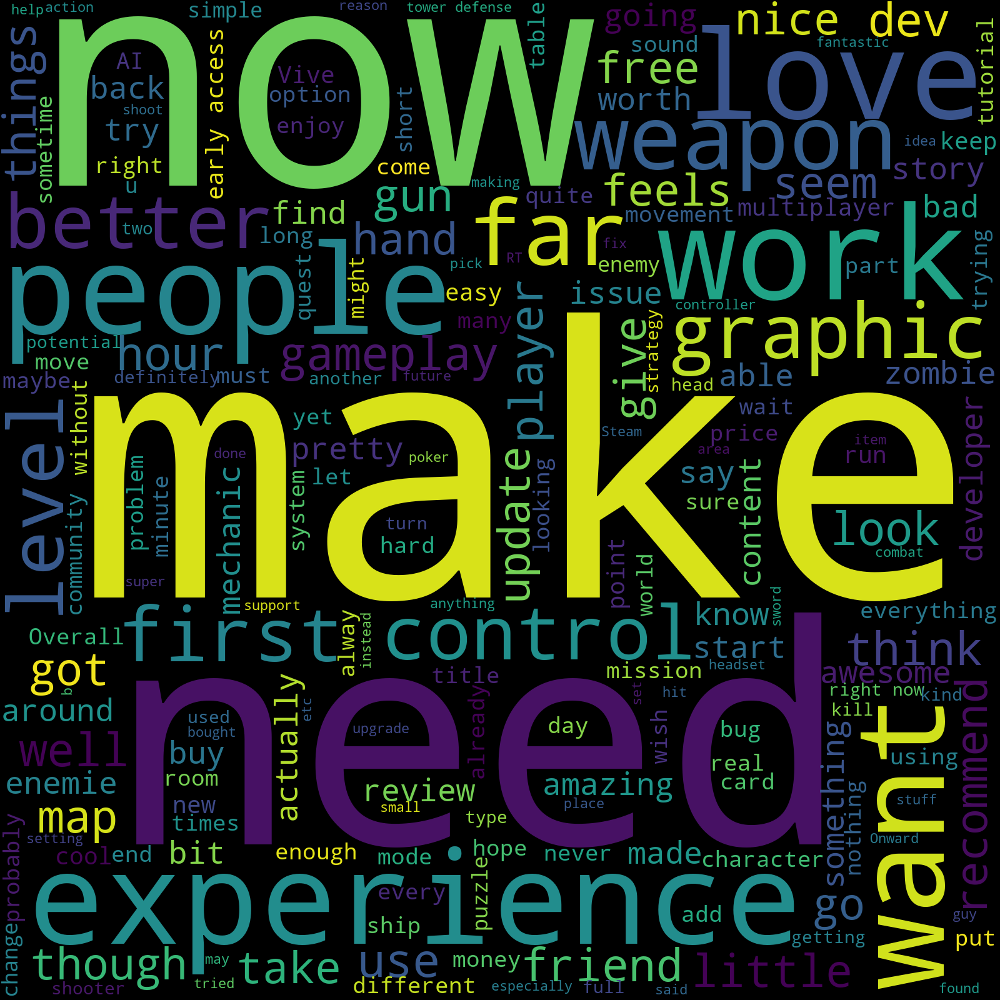


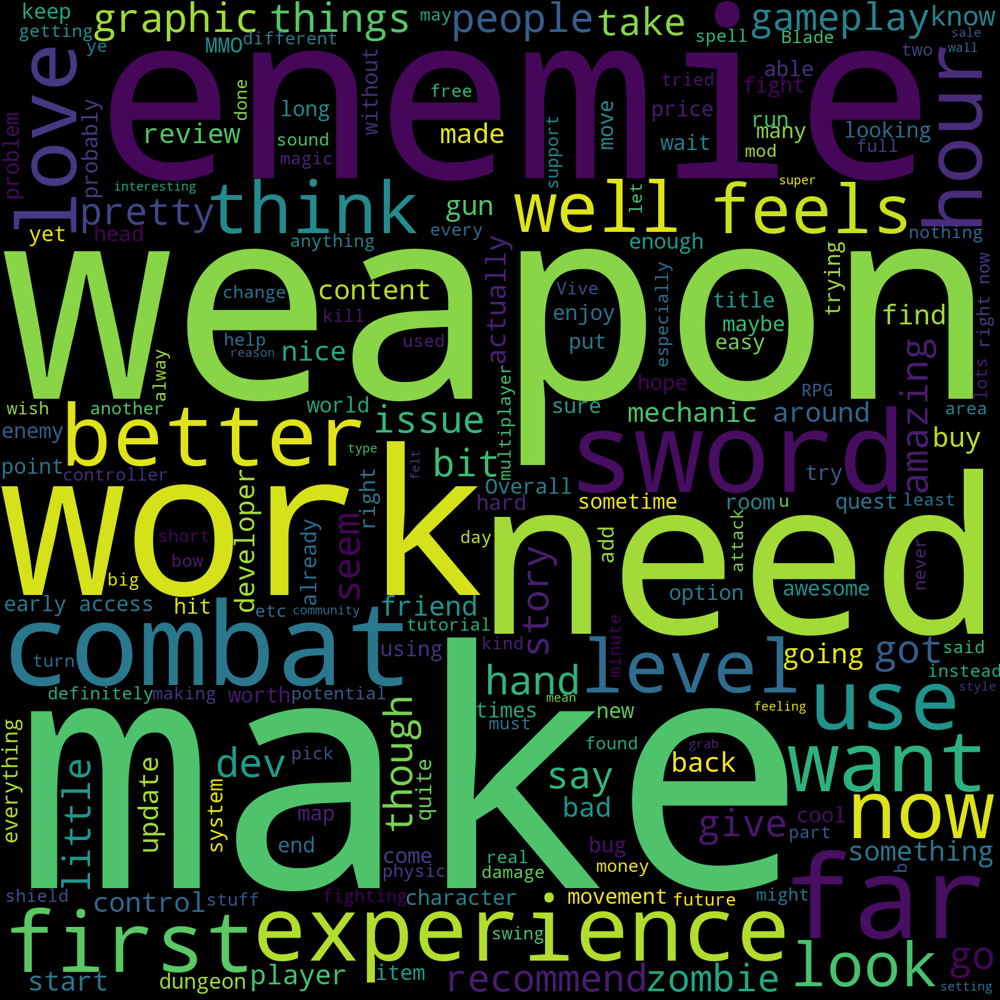


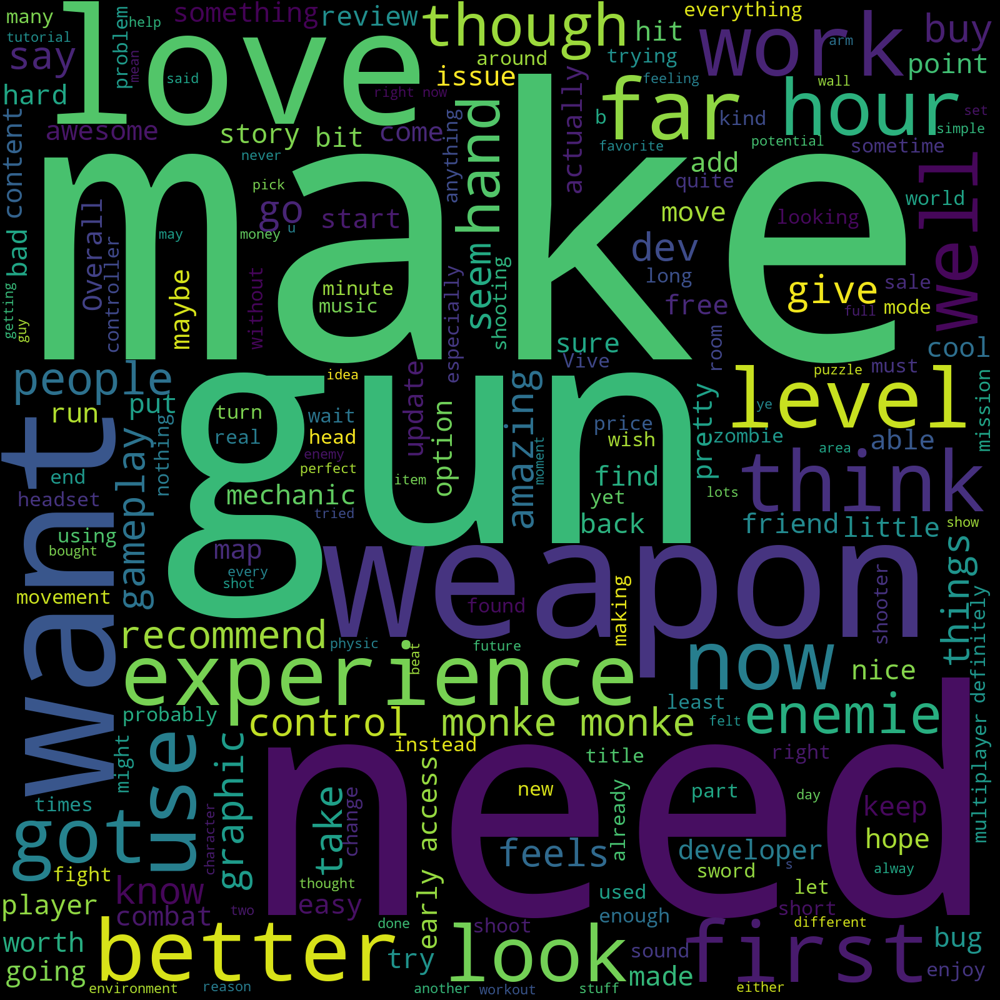


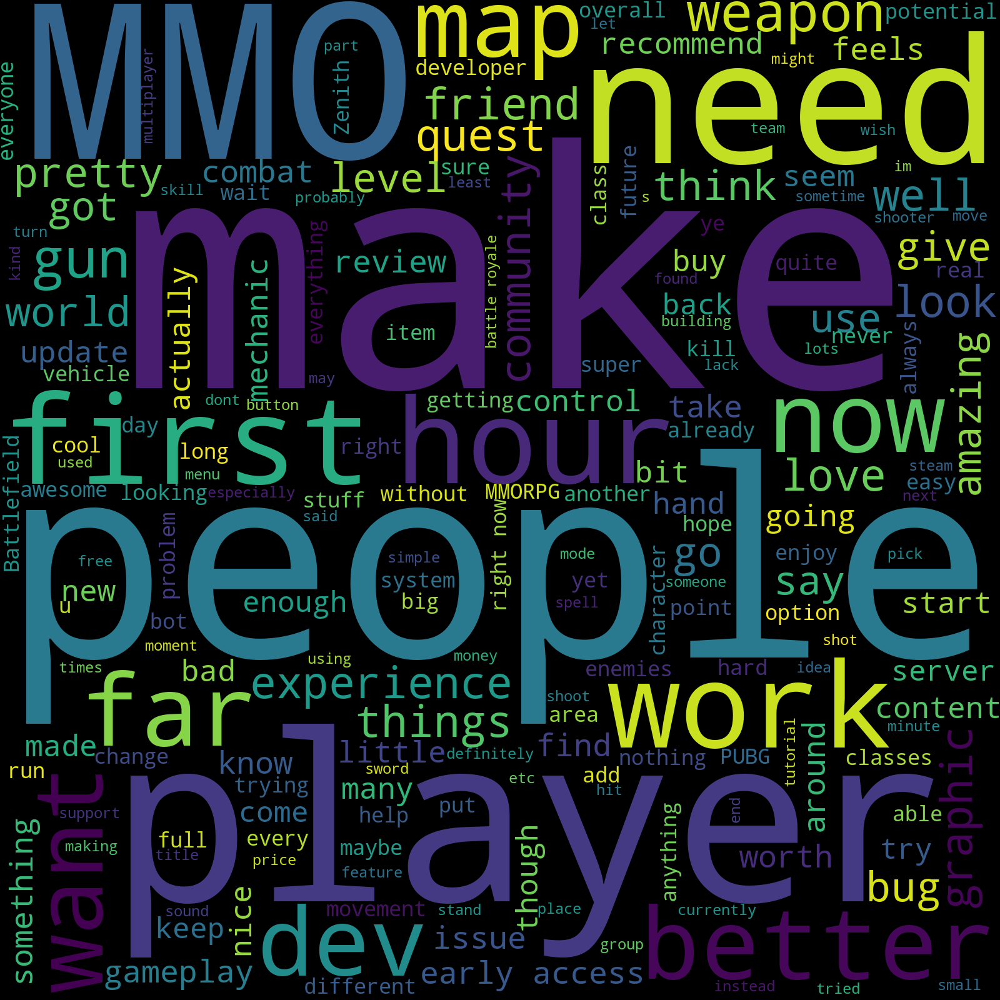


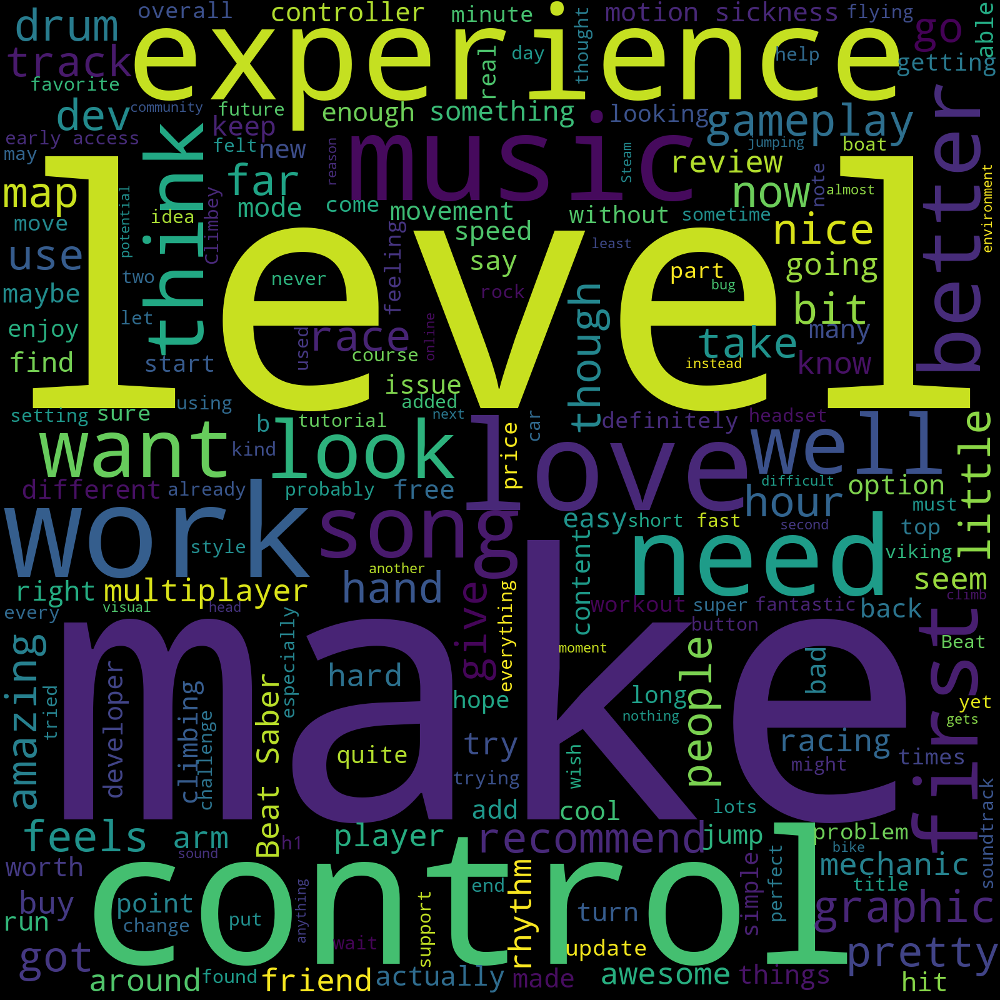


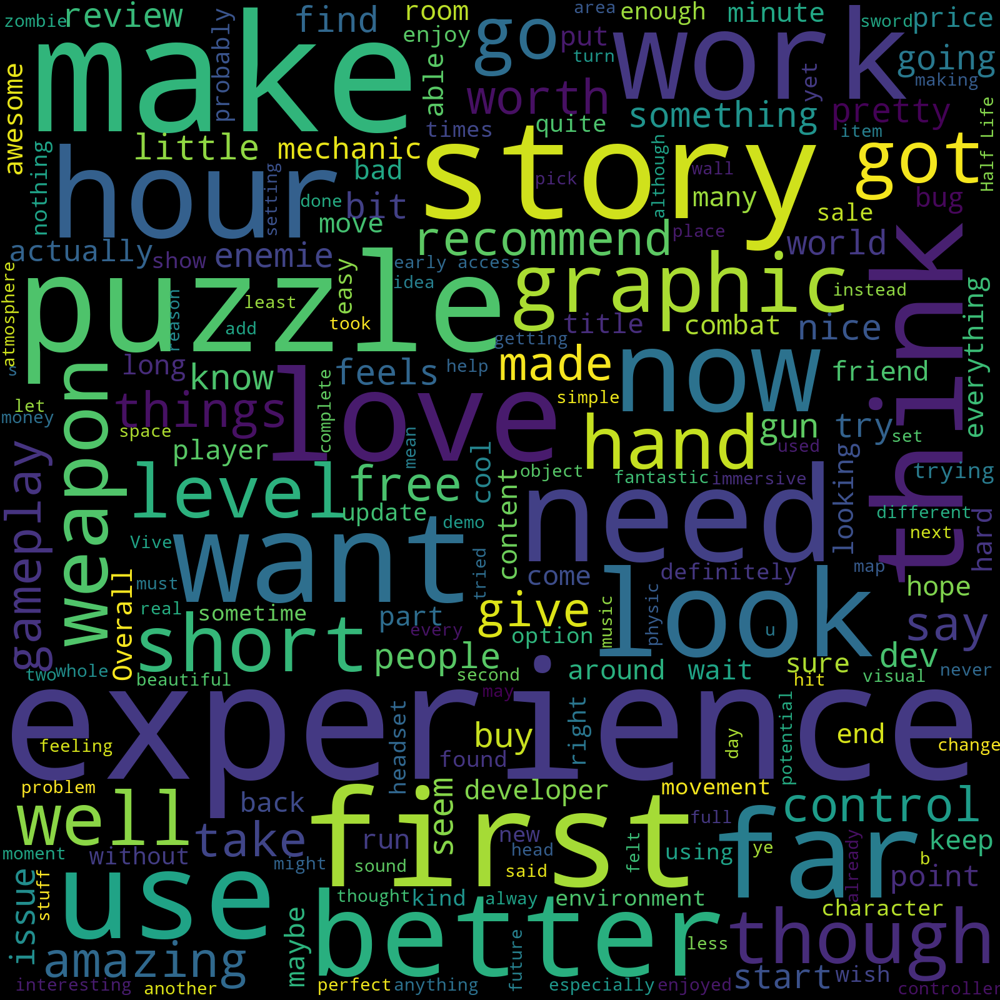


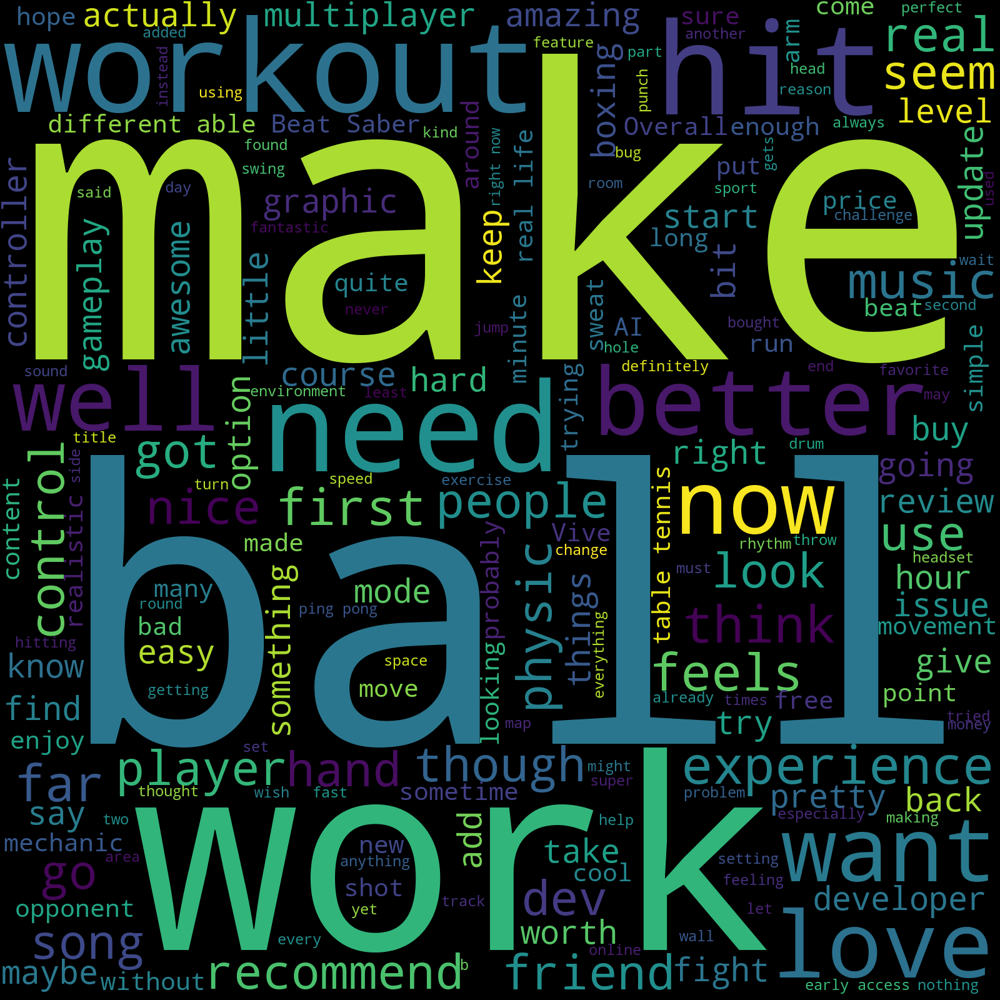


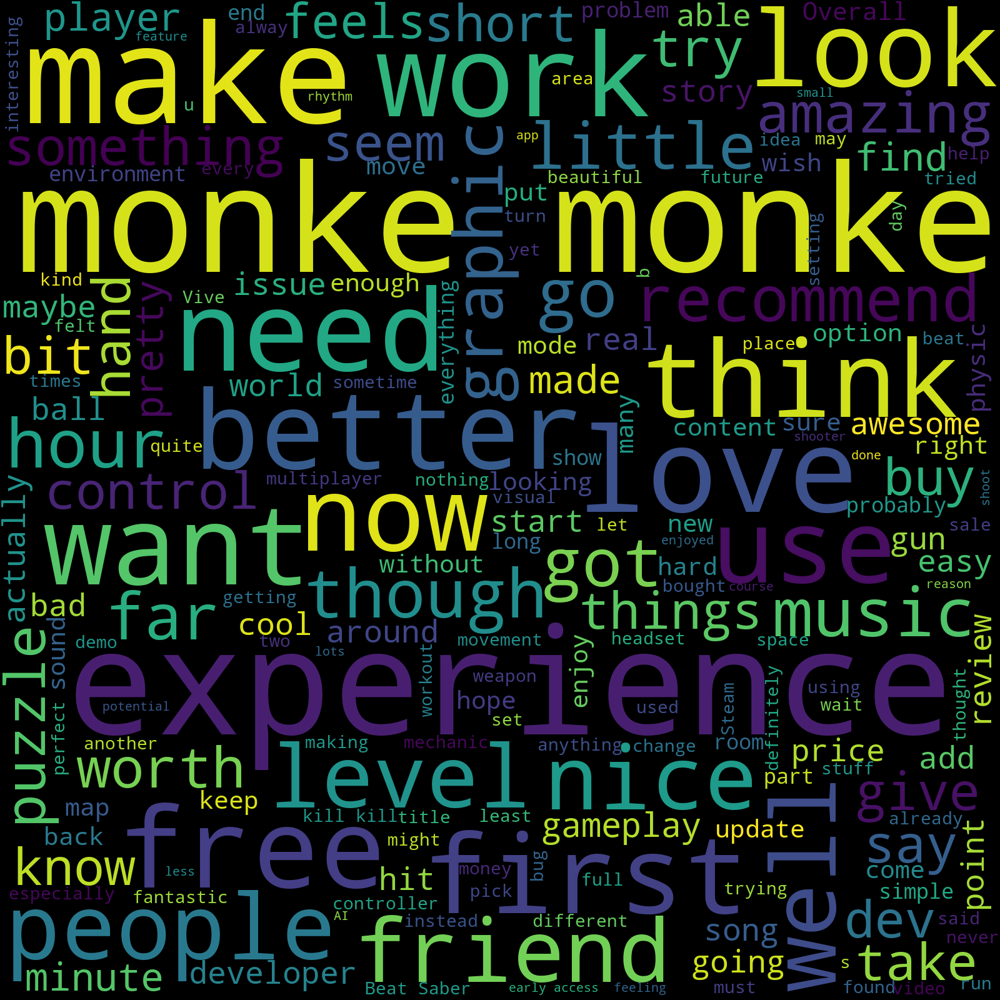


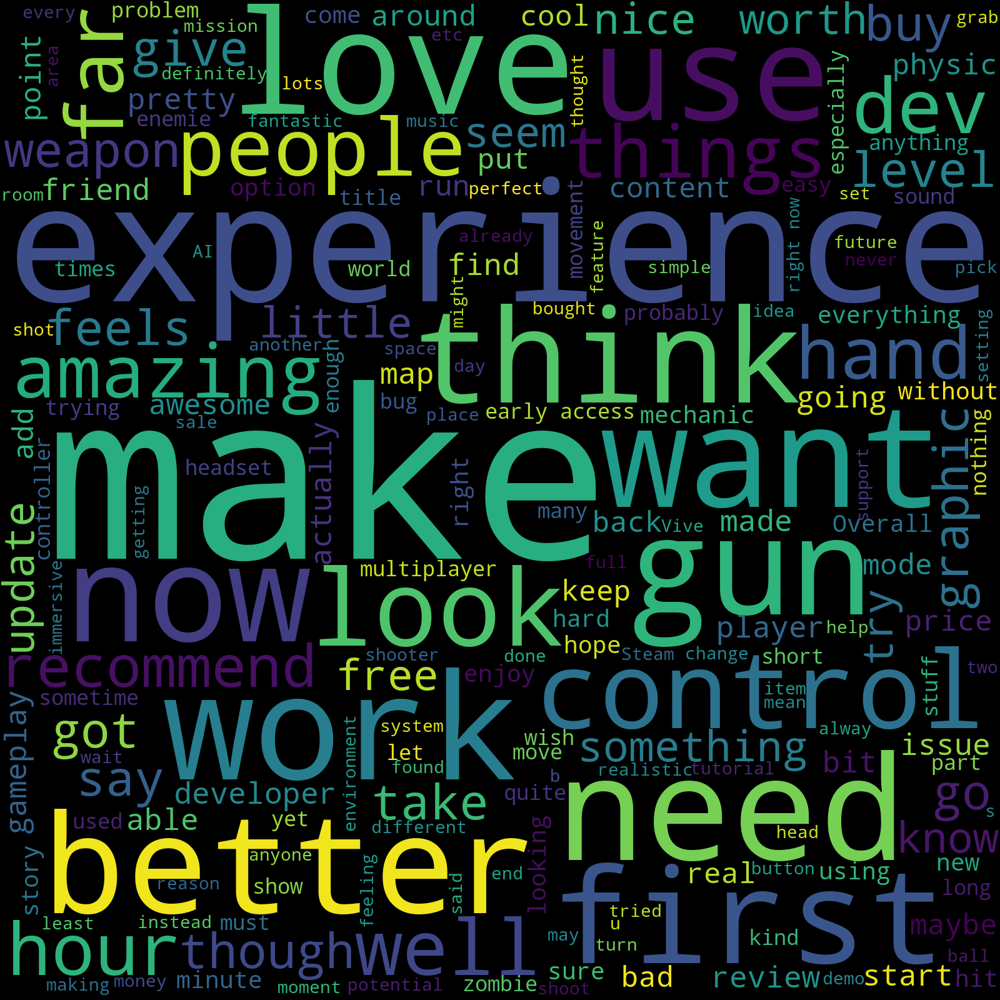

In [74]:
# 관용적인 표현 단어들 제외
# ex: I see a lot of potential on this game. Make fun. Game is good. Make me feel ~. One of the best games.
stopwords = [
    "game", "games", "play", "played", "playing",
    "VR", "one", "fun", "good", "great", "feel", "feels"
    "make", "time", "even", "really", "will",
    "see", "lot", "best", "much", "thing",
    "still", "way"
] + list(STOPWORDS)

for genre in genre_list:
    df_genre = df_reviews.loc[df_reviews["genre"].str.contains(genre)]
    review_text = df_genre["review"].str.cat(sep="\n")

    wc = WordCloud(
        stopwords=stopwords, width=800, height=800, scale=2.0
    )
    cloud = wc.generate(review_text)

    fig = px.imshow(cloud)
    fig.update_layout(title=genre, title_x=0.5, font=dict(size=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()


## 2. 명사만 추출


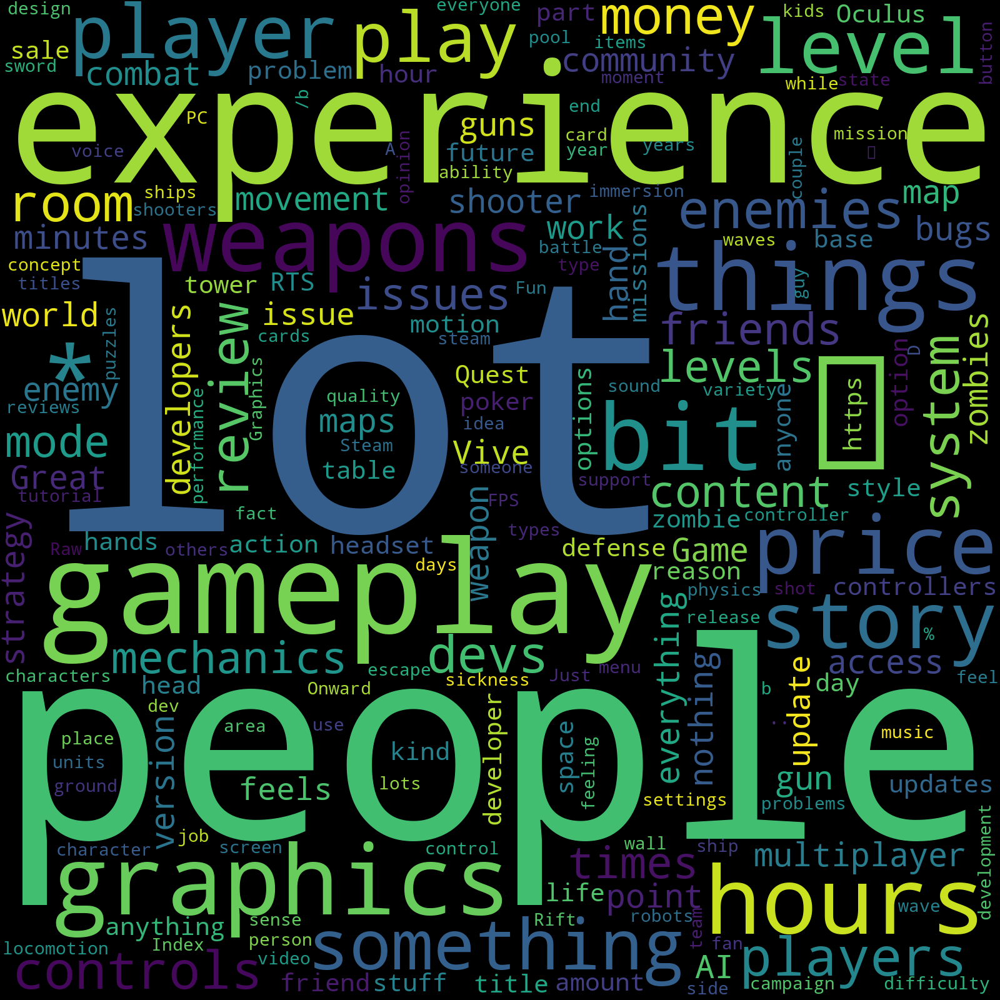


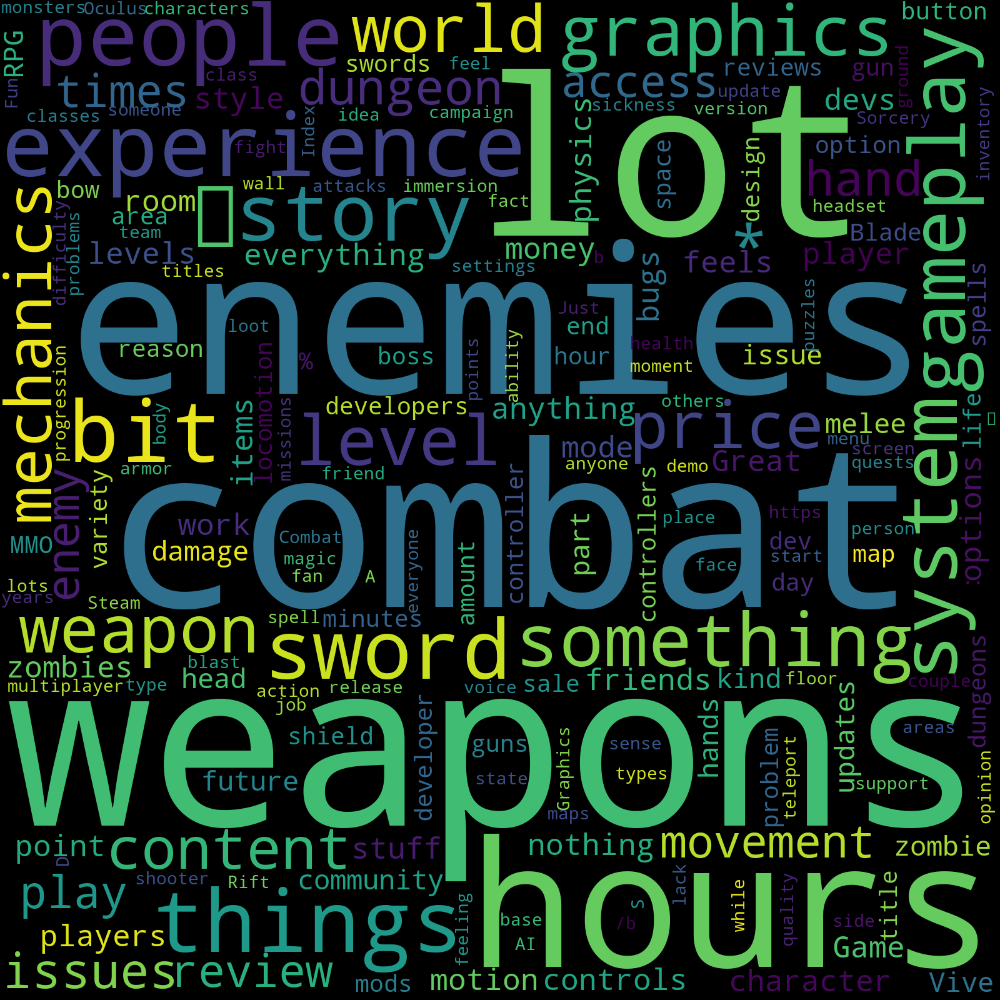

In [75]:
for genre in genre_list:
    df_genre = df_reviews.loc[df_reviews["genre"].str.contains(genre)]
    review_text = df_genre["review"].str.cat(sep="\n")

    # 명사만 추출 <- 장르 하나당 5~10분... 매우 느리다
    stopwords_noun = ["vr", "VR", "game", "games", "one", "thing", "playing", "time", "fun", "way", "lot", "I", "i", "[", "]"]
    tokenized = nltk.word_tokenize(review_text)
    nouns = [word for (word, pos) in nltk.pos_tag(tokenized) if (pos[:2] == "NN" and word not in stopwords_noun)]
    word_freq = Counter(nouns)

    wc = WordCloud(
        width=800, height=800, scale=2.0
    )
    cloud = wc.generate_from_frequencies(word_freq)

    fig = px.imshow(cloud)
    fig.update_layout(title=genre, title_x=0.5, font=dict(size=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()

## 3. 마스크로 장르별 모양 설정하기 

In [61]:
for genre in genre_list:
    df_genre = df_reviews.loc[df_reviews["genre"].str.contains(genre)]
    review_text = df_genre["review"].str.cat(sep="\n")

    # 미리 만들어둔 배경 이미지 로드
    mask = np.array(Image.open(f"./resource/mask_{genre.lower()}.png"))
    
    wc = WordCloud(
        stopwords=stopwords, background_color="white", mask=mask, max_words=100
    )
    cloud = wc.generate(review_text)
    # cloud = wc.generate_from_frequencies(word_freq)

    fig = px.imshow(cloud)
    fig.update_layout(title=genre, title_x=0.5, font=dict(size=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()



## 4. 부정적(비추천) 리뷰들만 추출

In [64]:
df_reviews_neg = df_reviews[df_reviews["voted_up"] == False]

for genre in genre_list:
    df_genre = df_reviews_neg.loc[df_reviews["genre"].str.contains(genre)]
    review_text = df_genre["review"].str.cat(sep="\n")

    wc = WordCloud(
        stopwords=stopwords, width=800, height=800, scale=2.0
    )
    cloud = wc.generate(review_text)

    fig = px.imshow(cloud)
    fig.update_layout(title=genre, title_x=0.5, font=dict(size=20))
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.show()

recommendationid  \
Title                                         
All-In-One Sports VR 0             89709946   
                     2             87601109   
                     7             90607853   
                     10            90435808   
                     14            88562644   
...                                     ...   
Hellsplit: Arena     1834          55909307   
                     1861          55465435   
                     1895          55234419   
                     1896          55233503   
                     1926          55038883   

                                                                      author  \
Title                                                                          
All-In-One Sports VR 0     {'steamid': '76561198078187111', 'num_games_ow...   
                     2     {'steamid': '76561197965526227', 'num_games_ow...   
                     7     {'steamid': '76561198140189772', 'num_games_ow...   
                     10    {'steamid': '76561198031937874', 'num_games_ow...   
                     14    {'steamid': '76561198000119200', 'num_games_ow...   
...                                                                      ...   
Hellsplit: Arena     1834  {'steamid': '76561198009533279', 'num_games_ow...   
                     1861  {'steamid': '76561198020823154', 'num_games_ow...   
                     1895  {'steamid': '76561198056894277', 'num_games_ow...   
                     1896  {'steamid': '76561198002575593', 'num_games_ow...   
                     1926  {'steamid': '76561197999263026', 'num_games_ow...   

                          language  \
Title                                
All-In-One Sports VR 0     english   
                     2     english   
                     7     english   
                     10    english   
                     14    english   
...                            ...   
Hellsplit: Arena     1834  english   
                     1861  english   
                     1895  english   
                     1896  english   
                     1926  english   

                                                                      review  \
Title                                                                          
All-In-One Sports VR 0     Initially I was someone thrilled with All-In-O...   
                     2     i bought this game thinking it looked fun and ...   
                     7     Archery - One of three sports that felt like i...   
                     10    If its on sale for cheap this could be fun, bu...   
                     14    I requested a refund, not option for left hand...   
...                                                                      ...   
Hellsplit: Arena     1834  A really nice game but need some improvements....   
                     1861  Graphics are nice & the game has the potential...   
                     1895  This game has potential, it truly does, but as...   
                     1896  looks fantastic, but the fighting itself is to...   
                     1926  + Feels like a bad version of "Blade and Sorce...   

                           timestamp_created  timestamp_updated  voted_up  \
Title                                                                       
All-In-One Sports VR 0            1617550058         1617550058     False   
                     2            1614509669         1614509669     False   
                     7            1618886349         1618886349     False   
                     10           1618623541         1618627069     False   
                     14           1615939688         1615939688     False   
...                                      ...                ...       ...   
Hellsplit: Arena     1834         1572462765         1581089996     False   
                     1861         1570302335         1570302335     False   
                     1895         1569169593         1569169593     